# 4. Hyperparameter Search

### I. Team-Members:
- Felix Gaber, 20221385@novaims.unl.pt
- Felix Gayer, 20220320@novaims.unl.pt
- David Halder, 20220632@novaims.unl.pt
- Lukas Stark, 20220626@novaims.unl.pt
- Rita Soares, 20220616@novaims.unl.pt


### II. Link to the Dataset:
https://drive.google.com/drive/folders/1D8Hd49L0OLlSz2oCuuctfCKDcR8HK_c4?usp=share_link


###III. Summary of the notebook:

In this notebook the hyperparameters of the best model of the handcrafted model are tuned and finally the best handcrafted- and the best tuned-model will be compared. For the hyperparamter tuning the general-purpose hyperparameter tuning library **KerasTuner**  with the tuner ``RandomSearch`` will be used. 

First,  the architecture of the handcrafted model version ten will get rebuild in a function with different hyperparameters, which are chosen closely to the model in order not to destroy the architecture. This function is then implemented in a configured RandomSearch tuner. This tuner will then run the model 20 times, changing the hyperparameters for every try. These trials are visualised using Tensorboard.

Next, the scores and hyperparameter values of the handcrafted model and the hyperparameter tuned model are compared. The tuned model achieved to outperform the handcrafted model, reaching a validation accuracy of ``0.764``.

Finally, the hypertuned model is evaluated on the test set. First, the model fitted on the train/val split is used for the evaluation of the model. An accuracy of ``0.6746`` could be reached on the test set. For the same model, fitted on the whole training set, the accuracy decreased to ``0.6418``, proabably due to overfitting on the training data. 

Since, this result was significantly below our set goal of an test accuracy of ``0.8``, there will be more trials of handcrafted models and also transfer learning will be implemented.





#References 

1. *Maladkar, Kishan (2018)*: Why Is Random Search Better Than Grid Search For Machine Learning. In Analytics India Magazine, 6/14/2018. Available online at https://analyticsindiamag.com/why-is-random-search-better-than-grid-search-for-machine-learning/, checked on 4/4/2023.

2. *Bergstra, James & Bengio, Yoshua (2012):* Random Search for Hyper-Parameter Optimization. In Journal of Machine Learning Research 13 (10), pp. 281–305. Available online at https://www.jmlr.org/papers/v13/bergstra12a.html.

3. *Goodfellow, Ian; Bengio, Yoshua; Courville, Aaron (2018):* Deep learning. 

4. *Keras [3] (2023):* 2D convolution layer (e.g. spatial convolution over images). Available online at https://www.tensorflow.org/api_docs/python/tf/keras/layers/Conv2D, updated on 3/23/2023, checked on 4/4/2023.

5. *Chollet, François (2018)*: Deep learning with Python. Shelter Island, NY: Manning.

6. *Chollet, Francois; Invernizzi, Luca; Jin, Haifeng; Long, James; O'Malley, Tom (2019)*: Keras documentation: Getting started with KerasTuner. Available online at https://keras.io/guides/keras_tuner/getting_started/, updated on 3/25/2021, checked on 4/5/2023.

7. *Tensorflow (2022)*: Introduction to the Keras Tuner. Available online at https://www.tensorflow.org/tutorials/keras/keras_tuner, updated on 12/15/2022, checked on 4/5/2023.



**Mount Personal GDrive**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**Data Access**
1. Create shortcut to shared folder '**03 Project**'
2. Create new folder on personal GDrive called '**DeepLearningProject**' and click on 'ADD SHORTCUT'
3. Check if following path is available '**/content/drive/MyDrive/DeepLearningProject/03 Project**'

In [ ]:
%cd '/content/drive/MyDrive/DeepLearningProject/03 Project'

/content/drive/.shortcut-targets-by-id/1_93ad1t8CGrSTc3bgngEEjuCVXLB6eHY/03 Project


# Imports

In [ ]:
!pip install keras-tuner -q
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt

import os
import pandas as pd
import tensorflow as tf
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras import Sequential, layers, initializers, regularizers, optimizers, metrics, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping
import plotly.graph_objects as go
from tensorflow.keras.layers import Conv2D, MaxPooling2D, BatchNormalization, Flatten, Dense, Dropout, Activation
from tensorflow import keras
from tensorflow.keras import layers

from tensorflow.keras.optimizers import SGD

from keras.callbacks import EarlyStopping, ModelCheckpoint
from datetime import datetime

import keras_tuner as kt


In [ ]:
#@title  Functions
model_name = 'missing'
def plot_curves(model_fit=None, model_name=model_name):
  if model_fit == None:
    df_hist = pd.read_csv(f'/content/drive/MyDrive/DeepLearningProject/03 Project/Handcrafted_le_net/{run_type}/{model_name}_hist.csv')
  else:
    # Create DataFrame object
    df_hist = pd.DataFrame.from_dict(model_fit.history)
    df_hist['Epoch'] = np.arange(1, len(df_hist) + 1, 1)
    df_hist['accuracy_difference'] = round(df_hist.accuracy - df_hist.val_accuracy, 2)
    # save results dataframe as csv
    df_hist.to_csv(f'/content/drive/MyDrive/DeepLearningProject/03 Project/Handcrafted_le_net/{run_type}/{model_name}_hist.csv', index=False)

  fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(8, 8))

  # Plot accuracy and validation accuracy
  axs[0].plot(df_hist['Epoch'], df_hist['accuracy'], label='Training Accuracy')
  axs[0].plot(df_hist['Epoch'], df_hist['val_accuracy'], label='Validation Accuracy')
  axs[0].set_xlabel('Epoch')
  axs[0].set_ylabel('Accuracy')
  axs[0].legend(loc='upper left')

  # Plot loss and validation loss
  axs[1].plot(df_hist['Epoch'], df_hist['loss'], label='Training Loss')
  axs[1].plot(df_hist['Epoch'], df_hist['val_loss'], label='Validation Loss')
  axs[1].set_xlabel('Epoch')
  axs[1].set_ylabel('Loss')
  axs[1].legend(loc='lower left')

  # Display final 5 results
  display(df_hist[['Epoch', 'accuracy', 'val_accuracy', 'accuracy_difference']].tail(5))
  print('\n','\n')

  # Show the plot
  plt.show()

# 4.1 Loading the Dataset

The test, validation and training data are loaded into the notebook. The parameters and augmentations, which have been used before in the notebook "Handcrafted Model" with the baseline "LeNet-5", are also imported here and applied to the respective dataset.

In [ ]:
# Set the machine
gdrive = True

# Set the connection string
path = '/content/drive/MyDrive/DeepLearningProject/03 Project/Data/'
main_folder, training_folder, testing_folder = "Tire Textures/", "training_data/", "testing_data/"

In [ ]:
#Set dataset parameters
image_size = (224, 224)
crop_to_aspect_ratio = True
color_mode = 'rgb' 
batch_size = 32
label_mode = 'binary'
validation_split = 0.2
shuffle = True
seed = 42

# Defines input shape from image size
input_shape = (*image_size, 1 if color_mode=='grayscale' else 3)

In [ ]:
# Generate training and validation datasets directly from directory
path = '/content/drive/MyDrive/DeepLearningProject/03 Project/Data/'
ds_train, ds_val = image_dataset_from_directory(
    directory=path + main_folder + training_folder,
    image_size=image_size,
    crop_to_aspect_ratio=crop_to_aspect_ratio,
    color_mode=color_mode,
    batch_size=batch_size,
    label_mode=label_mode,
    subset='both',
    validation_split=validation_split,
    shuffle=shuffle,
    seed=seed
)

# Check object properties
print("\nObject's type:\t", type(ds_train))
print("Is it a tf.data.Dataset?\t R:", isinstance(ds_train, tf.data.Dataset))
print("Classes:", ds_train.class_names)


ds_test = image_dataset_from_directory(path + main_folder + testing_folder, 
                                       image_size=image_size,
                                       crop_to_aspect_ratio=crop_to_aspect_ratio,
                                       color_mode=color_mode,
                                       batch_size=batch_size,
                                       label_mode=label_mode,                                     
                                       shuffle=shuffle,
                                       seed=seed)



Found 703 files belonging to 2 classes.
Using 563 files for training.
Using 140 files for validation.

Object's type:	 <class 'tensorflow.python.data.ops.batch_op._BatchDataset'>
Is it a tf.data.Dataset?	 R: True
Classes: ['cracked', 'normal']
Found 335 files belonging to 2 classes.


- **Training Set:** 563 Original Pictures
- **Validation Set:** 140 Original Pictures
- **Test Set:** 335 Original Pictures

# 4.2 Hyperparameter Tuning with KerasTuner

Next the hyperparameters of the best performing handcrafted models, will get hyperparameter tuned. To do so, the KerasTuner library will be utilised. The tuner for this hyperparameter search will be a **Random Search**. 

Random search is an optimization method where random combinations of the defined hyperparameters are used to find the optimal solution for the given model. *(see Maladkar, 2018)* [1]

It was decided to utilize this method since for this project the scope of the computational power was limited and it was concluded before by *Bergstra and Bengio (2021, p. 291)* [2] that the extent of a grid search is determined by the computational budget and that this method can be outperformed by a RandomSearch if a large search space and many trials are defined.

The Hyperparameters for this experiment are as follows: 

- **Size of the Kernel convolutional layers:** 
  - The bigger the size of the Kernel/Filter the bigger are the number of parameters in the model. This increases the model capacity and thus the complexity *(See Goodfellow et al, 2018, p. 426)* [3]

- **Number of Filters/Kernels for the convolutional layers**: 
  - Like the size of the filters also the number of filters, increases the parameters in the model, which then again increases model complexity.

- **Number of hidden units in the dense layers:**
  - Incrasing the number of hidden units also increases the capacity and the complexity of the model. Can lead to overfitting. *(See Goodfellow et al, 2018, p. 426)* [3]
- **The learning rate:**
  - A learning rate which is not properly tuned results in an ineffective model du to optimization failure. A low learning rate slows the process down but converges seamlessly, a big one might not converge at all. *(See Goodfellow et al, 2018, p. 426)* [3]
- **Implicit zero padding**
  - While it increases the time and memory cost of most operations, it also keeps the representation site large which then again increases the capacity of the model. *(See Goodfellow et al, 2018, p. 426)* [3]
- **Weight Decay Coefficient (Regularization):** 
  - Regularization Methods, like the L1 or L2 regularization, reduce the model complexity, thus can be used to reduce overfitting. Weight decay coefficients can be used on convolutional layers as well as on dense fully connected layers. *(See Goodfellow et al, 2018, p. 426)* [3]
  There are three different types of regularizers which can be adjusted: 
    1. **Kernel Regularizer**: A penalty is applied on the layer’s kernel weights matrix
    2. **Bias Regularizer**: A penalty is applied only on the layer’s bias vector
    3. **Activity Regularizer**: A penalty is applied to the output of the layer *(See Keras, 2023)* [4]

- **Dropout Rate:**
  - The dropout rate determined the rate in which units are dropped during the training process. When units are dropped less often, they get more opportunities to "communicate" with each other to fit the training set. Thus, droupout layers can help with overfitting. *(See Goodfellow et al, 2018, p. 426)* [3]

In order to tune the discussed hyperparamters, the process proposed by *François Chollet (2018)*[5] is applied: 

1. Choose a set of hyperparameters and its values
2. Build the corresponding model
3. Fit it to your training data and measure the final performance on the validation data
4. Choose the next set of hyperparameters to try (automatically) 
5. Repeat
6. Eventually, performance is measured on the test data

The values in the search space are chosen close the values which have proven to be effective during the development of the respective handcrafted model and will be discussed later in the course of the inspection of the search space.

## 4.2.1 Hyperparameter Tuning for Handcrafted Model Version 10

In the following section the best performing handcrafted model, which had the LeNet-5 as a baseline will get  tuned. 

To do so, the architecture of the model is rebuild, but hyperparameters are defined within its layers. This is achieved by building the model within a function and utilizing the argument ``hp`` to define hyperparameters within the layers. 

Several kinds of hyperparameters will be used. For example, if the argument ``hp.Int('units', min_value=32, max_value=512, step=32)`` is applied, that means that an integer hyperparameter was defined, with a range from 32 to 512 and a minmum sampling step of 32. (see Chollet et al., 2019)[6]

In [ ]:
model_name = "HCM_V10"

#Preprocessing Pipeline
data_normalization = Sequential([
    layers.Rescaling(1/255)
    ], name='normalization_pipeline')

def build_model(hp):
   model = keras.Sequential([
       
    # Input layer
    layers.Input(input_shape),
    # Normalization pipeline
    data_normalization,

    # 1. conv layer   
    keras.layers.Conv2D(
        #adding filter 
        filters=hp.Int('conv_1_filter', min_value=4, max_value=10, step=1),
        # adding filter size or kernel size
        kernel_size=hp.Choice('conv_1_kernel', values = [4,5,7]),

        #Kernel_regularizer
        kernel_regularizer=regularizers.l2(hp.Float("Reg_L2_1",
                                  min_value=0.0,
                                  max_value=0.1, 
                                  step = 0.01)
        ),
        #activation function
        activation='relu'),

     #Max Pooling Layer 
     layers.MaxPooling2D(pool_size=(2, 2)),

     #Second Conv Layer
     keras.layers.Conv2D(
        #adding filter 
        filters=hp.Int('conv_2_filter', min_value=12, max_value=24, step=2),
        # adding filter size or kernel size
        kernel_size=hp.Choice('conv_2_kernel', values = [4,5,7]),

        #Kernel_regularizer
        kernel_regularizer=regularizers.l2(hp.Float("Reg_L2_2",
                                  min_value=0.0,
                                  max_value=0.1, 
                                  step = 0.01)
        ),
        #activation function
        activation='relu'),

     #Max Pooling Layer 
    layers.MaxPooling2D(pool_size=(2, 2)),


    # Flatten layer
    layers.Flatten(),


   # Fully connected layers with Batch Normalization and Dropout:
    # Dense 1:
    keras.layers.Dense(
        units=hp.Int('dense_1_units', min_value=100, max_value=160, step=20),
        activation='relu', 
        kernel_initializer=initializers.GlorotNormal(seed=seed)),

    #Dropout 1:
    keras.layers.Dropout(rate = hp.Float("Dropout_1",
                                  min_value=0.1,
                                  max_value=0.8, 
                                  step = 0.2)),
                        
    #Dense 2:
    keras.layers.Dense(
        units=hp.Int('dense_2_units', min_value=66, max_value=96, step=6),
        activation='relu', 
        kernel_initializer=initializers.GlorotNormal(seed=seed)),

    #Dropout 2:
     keras.layers.Dropout(rate = hp.Float("Dropout_2",
                                  min_value=0.1,
                                  max_value=0.8, 
                                  step = 0.2)),
    #Dense 3:
    keras.layers.Dense(
        units=hp.Int('dense_3_units', min_value=48, max_value=64, step=6),
        activation='relu', 
        kernel_initializer=initializers.GlorotNormal(seed=seed)
    ),

    #Dropout 3,
     keras.layers.Dropout(rate = hp.Float("Dropout_3",
                                  min_value=0.1,
                                  max_value=0.8, 
                                  step = 0.2)),
    # Output layer
    layers.Dense(1, activation="sigmoid")
    ], name=model_name)
   
   model.compile(optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', values=[0.0001, 0.0002, 0.0003])),
              loss='binary_crossentropy',
              metrics=['accuracy'])
   return model


In [ ]:
#@title 4.2.1.1 Test if the model successfully builds
build_model(kt.HyperParameters())

In [ ]:
#@title 4.2.1.2 Configuration of the tuner
#creating randomsearch object
tuner = kt.RandomSearch(
    #Hypermodel function
    hypermodel=build_model,
    #Objective: Accuracy on the validation set
    objective='val_accuracy',
    #Max Trials: The total number of trials to run during the search.
    max_trials = 20, 
    #Executions per trial:  The number of models that should be built and fit for each trial.
    executions_per_trial = 1, 
    #Previous results get overwritten
    overwrite=False,
    #Directory:
    directory="Hyper_Parameter_Tuning",
    project_name="HCM_V10",
    )

After checking if the model successfully builds, the tuner, in this case ``RandomSearch`` is configured.The following arguments are specified: 
  - **Hypermodel**: The model function for the handcrafted LeNet 5
  - **Objective**: The value which the hyperparameter tuning is trying to maximize/minimize. In this particular example  the ojective is set to ``validation_accuracy`` which means that the search will aim to maximize the validation accuracy of the model.
  - **Max_Trials**: the number of maximum trials the search will conduct. Ten trials means that ten different combinations of hyperparamters are tested.  
  - **Executions per trial**:  The number of models that are built and fit for each trial/hyperparameter combination. 
  - **Overwrite**: Controls whether to overwrite the previous results in the same directory, or if the previous search is resumed. Due to storage limitations, this is set to ``True``.
  - **Directory & project_name**: Path to the directory and the subdirectory for storing the search results

*(See Chollet et al., 2019)* [6]

In [ ]:
#@title 4.2.1.3 Search space exploration
tuner.search_space_summary()

Search space summary
Default search space size: 13
conv_1_filter (Int)
{'default': None, 'conditions': [], 'min_value': 4, 'max_value': 10, 'step': 1, 'sampling': 'linear'}
conv_1_kernel (Choice)
{'default': 4, 'conditions': [], 'values': [4, 5, 7], 'ordered': True}
Reg_L2_1 (Float)
{'default': 0.0, 'conditions': [], 'min_value': 0.0, 'max_value': 0.1, 'step': 0.01, 'sampling': 'linear'}
conv_2_filter (Int)
{'default': None, 'conditions': [], 'min_value': 12, 'max_value': 24, 'step': 2, 'sampling': 'linear'}
conv_2_kernel (Choice)
{'default': 4, 'conditions': [], 'values': [4, 5, 7], 'ordered': True}
Reg_L2_2 (Float)
{'default': 0.0, 'conditions': [], 'min_value': 0.0, 'max_value': 0.1, 'step': 0.01, 'sampling': 'linear'}
dense_1_units (Int)
{'default': None, 'conditions': [], 'min_value': 100, 'max_value': 160, 'step': 20, 'sampling': 'linear'}
Dropout_1 (Float)
{'default': 0.1, 'conditions': [], 'min_value': 0.1, 'max_value': 0.8, 'step': 0.2, 'sampling': 'linear'}
dense_2_units (Int

Next, the defined search space of the configured ``RandomSearch`` is checked and explained.

The search space consists of 13 different Hyperparameters. The choise for this space was made, considering the computational power available. It was refrained from adding more hyperparameters or even adding layers randomly, since with an extended search space the RandomSearch would have been needed to be extended as well, to work effectively. Otherwise there would have been a risk, that the model is altered to a worse perfomance. Thus, he search space was designed to be as close as possible to the original model, since the objective is to finetune the model. The Hyperparameters can be found here:

- **conv_1_filter** (Integer Hyperparameter): Number of filters in the first convolutional layer. Search space ranges from 4 to 10 with a step of 1.

- **conv_1_kernel** (Choice Hyperparameter): Kernel size of the first convolutional layer. Search space consists of three values: 4, 5, and 7.

- **Reg_L2_1** (Float Hyperparameter): L2 regularization coefficient for the first convolutional layer. Search space ranges from 0.0 to 0.1 with a step of 0.01.

- **conv_2_filter** (Integer Hyperparameter): Number of filters in the second convolutional layer. Search space ranges from 12 to 24 with a step of 2.

- **conv_2_kernel** (Choice Hyperparameter): Kernel size of the second convolutional layer. Search space consists of three values: 4, 5, and 7.

- **Reg_L2_2** (Float Hyperparameter): L2 regularization coefficient for the second convolutional layer. Search space ranges from 0.0 to 0.1 with a step of 0.01.

- **dense_1_units** (Integer Hyperparameter): Number of units in the first dense layer. Search space ranges from 100 to 160 with a step of 20.

- **Dropout_1** (Float Hyperparameter): Dropout probability for the first dense layer. Search space ranges from 0.1 to 0.8 with a step of 0.2.

- **dense_2_units** (Integer Hyperparameter): Number of units in the second dense layer. Search space ranges from 66 to 96 with a step of 6.

- **Dropout_2** (Float Hyperparameter): Dropout probability for the second dense layer. Search space ranges from 0.1 to 0.8 with a step of 0.2.
- **dense_3_units** (Integer Hyperparameter): Number of units in the third dense layer. Search space ranges from 48 to 64 with a step of 6.

- **Dropout_3** (Float Hyperparameter): Dropout probability for the third dense layer. Search space ranges from 0.1 to 0.8 with a step of 0.2.

- **learning_rate** (Choice Hyperparameter): Learning rate for the optimizer. Search space consists of three values: 0.0001, 0.0002, and 0.0003.



Similiar to the handcrafted model an early stopping callback is defined, to avoid overfitting and to make the process more efficient.

Moreover, for the visualisation of the trials ``Tensorboard`` is used. Due to some technical issues the HPARAMS couldn't be loaded into ``Tensorboard``. Thus, the hyperparameters will be explored via the  ``keras_tuner`` library.

The trials will run for 50 epochs maximum.

In [ ]:
#@title 4.2.1.4 RandomSearch
#Define early stopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    verbose = 1,
    restore_best_weights=True)

!rm -rf ./Hyper_Parameter_Tuning/logs/
log_dir = "/Hyper_Parameter_Tuning/logs/" + model_name + "/" + datetime.now().strftime("%Y%m%d-%H%M%S")


# search best parameter
tuner.search(ds_train, 
             epochs=50, #A high number of epochs is defined, since an early stopping callback is applied
             validation_data=ds_val, 
             callbacks = [early_stopping, keras.callbacks.TensorBoard(log_dir)])

Trial 20 Complete [00h 04m 19s]
val_accuracy: 0.6857143044471741

Best val_accuracy So Far: 0.7642857432365417
Total elapsed time: 02h 19m 05s


## 4.2.2 Hyperparameter Tuning Assessment (Validation Set)

In [ ]:
%load_ext tensorboard

%tensorboard --logdir /Hyper_Parameter_Tuning/logs/  --port=8007

<IPython.core.display.Javascript object>

Tensorboard is used in order to visualise the changes in the learning curves per epoch per trial. It can be seen clearly that the chosen Hyperparameters have a tremendous impact on the accuracy and loss values. (see Figure 1)

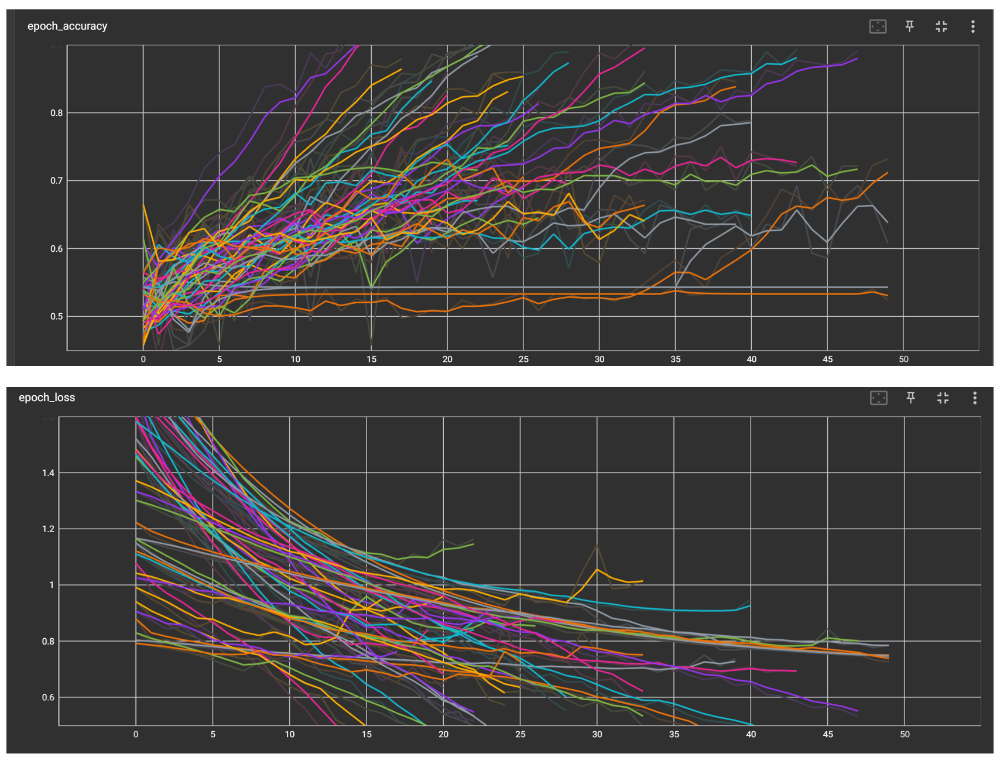
*Figure 1 Learning Curves of all trials*

However, the best performance in terms of validation accuraccy was achieved by trial number nine, achieveing a validation accuracy of ``0.764``, which is 3.5 percentage points higher than the Handcrafted Model Version 10 (Baseline: LeNet-5) with a validation accuraccy of ``0.729``. 

The following Hyperparameters did change:

Hyperparameters: (Handcrafted -> Tuned)
- conv_1_filter: ``6 -> 7``
- conv_1_kernel: ``5 -> 7``
- Reg_L2_1:      ``0.06 -> 0.02``
- conv_2_filter: ``16 ->  16``
- conv_2_kernel: ``5 -> 7``
- Reg_L2_2: ``0.06 -> 0.08``
- dense_1_units: ``120->140``
- Dropout_1: ``0.6 -> 0.1``
- dense_2_units: ``84-> 66``
- Dropout_2: ``0.6 -> 0.1``
- dense_3_units: ``64 -> 60``
- Dropout_3: ``0.6 -> 0.3``
- learning_rate: ``0.0001 -> 0.0002``




As soon as the search is concluded, the best models can be retrieved. It is saved at the best performing epoch on the validation data. The summary of the best model and of the tuner are called, to get a good understanding of the best performing architecture and hyperparameters.

In [ ]:
# Get the top 2 models.
models = tuner.get_best_models(num_models=2)
best_model = models[0]


best_model.build()
best_model.summary()

Model: "HCM_V10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_pipeline (Seq  (None, 224, 224, 3)      0         
 uential)                                                        
                                                                 
 conv2d (Conv2D)             (None, 218, 218, 7)       1036      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 109, 109, 7)      0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 103, 103, 16)      5504      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 51, 51, 16)       0         
 2D)                                                             
                                                           

Comparing the learning curves of the handcrafted model and the hypertuned one it shows that the hypertuned model is higher in terms of validation accuraccy, but also shows a higher amount of overfitting. See Figure 2

One reason for this is the higher complexity of the model. In the hyperparamter tuned model we can find ``5,846,307`` learnable parameters while in the handcrafted model there are ``5,411,941``. Furthermore, as seen in the comparison of the hyperparameters, the rates of the ``Dropout`` Layers got reduced significantly, which also supports the overfitting on the training set

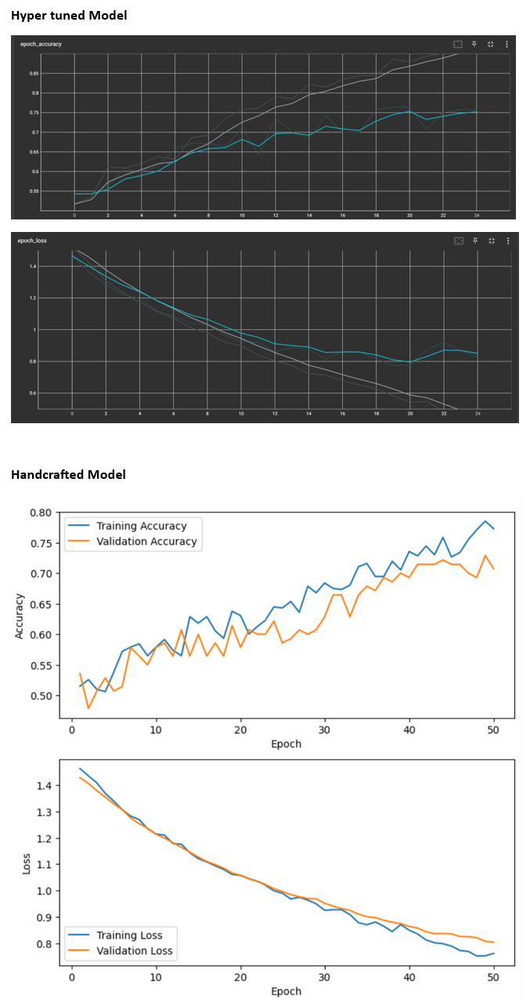
*Figure 2 Learning Curves of the HCM_V10 before and after Hyperparameter Tuning*

---


In [ ]:
tuner.results_summary(2)

Results summary
Results in Hyper_Parameter_Tuning/HCM_V10
Showing 2 best trials
Objective(name="val_accuracy", direction="max")

Trial 09 summary
Hyperparameters:
conv_1_filter: 7
conv_1_kernel: 7
Reg_L2_1: 0.02
conv_2_filter: 16
conv_2_kernel: 7
Reg_L2_2: 0.08
dense_1_units: 140
Dropout_1: 0.1
dense_2_units: 66
Dropout_2: 0.1
dense_3_units: 60
Dropout_3: 0.30000000000000004
learning_rate: 0.0002
Score: 0.7642857432365417

Trial 06 summary
Hyperparameters:
conv_1_filter: 5
conv_1_kernel: 4
Reg_L2_1: 0.03
conv_2_filter: 14
conv_2_kernel: 5
Reg_L2_2: 0.0
dense_1_units: 100
Dropout_1: 0.1
dense_2_units: 72
Dropout_2: 0.5
dense_3_units: 54
Dropout_3: 0.30000000000000004
learning_rate: 0.0001
Score: 0.75


Comparing the two best trials with the handcrafted model, it shows that they are rather similiar. The biggest differences are the learning rates and the dropout layers. 

The Model from trial number six also shows heavy overfitting on the training data. This could be due to the L2 Regularization being 0 and the comparatively low dropout rates. (See Figure 3)

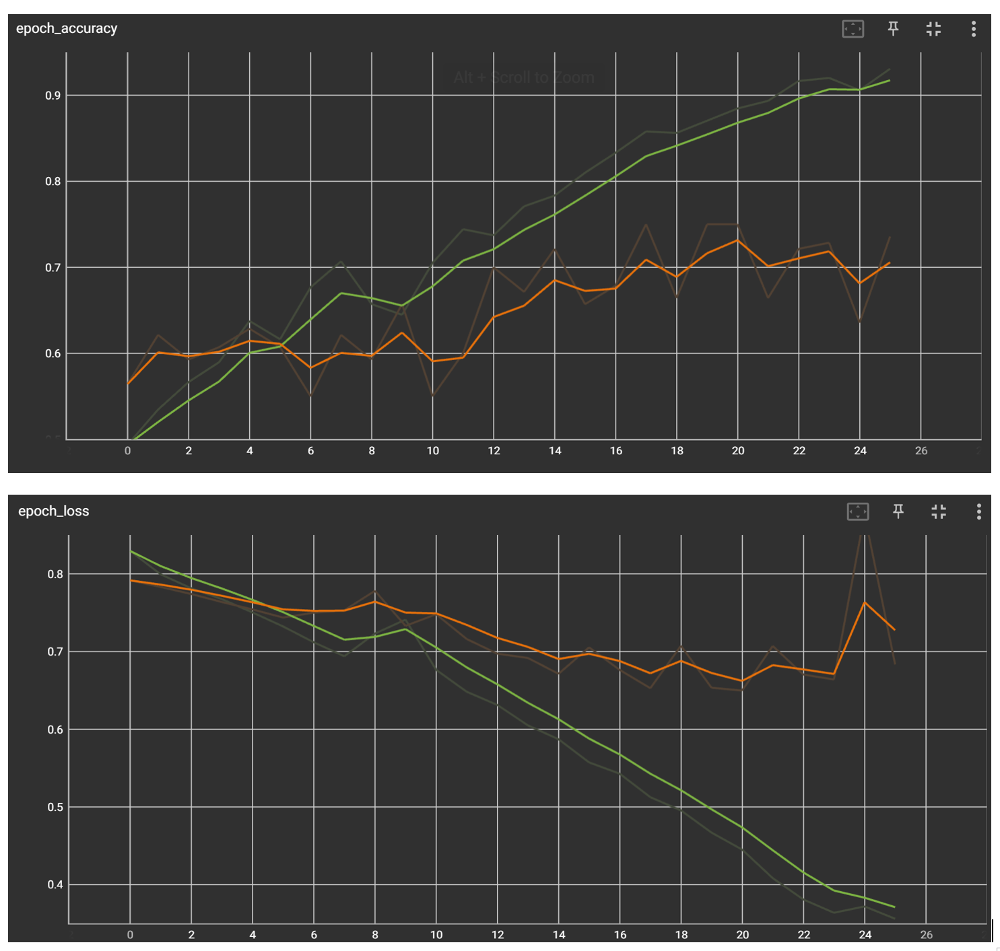

*(Figure 3 Learning Curves of trial six)*

# 4.3 Evaluating the Hyperparameter tuned model on the Test Set

(As proposed by Chollet (2018, p. 115) the training and the validation data is finally combined and the final model with the tuned hyperparameters is fitted on the whole training set. )

To find out the optimal number of epochs the model is trained once more, and the epoch with the highest ``validation_accuracy``is extracted. (See Tensorflow, 2022)

In order to be independent from the runtime, the model will be build manually again, with the optimal hyperparameters from the ``Randomsearch``. Next the fitted model will be evaluated on the Test-Set.

Finally, the training and the validation set will be combined in order to increase the training size and the model will be trainied again using the test set to evaluate it.


## 4.3.1 Evaluating on the fitted model using the Training/Validation Split
First the model will get retrained, utilising the training/validation split, which was already used before. This has the reason, that the model could overfit on the whole training data, thus producing a lower score. Therefore, both methods will be conducted.

In [ ]:
# Rebuilding the model based on the optimal hyperparameters
model_name = "HCM_V10_Tuned"

HCM_V10_hyper = Sequential([
    # Input layer
    layers.Input(input_shape),
    # Normalization pipeline
    data_normalization,
    # 1. conv layer
    layers.Conv2D(filters=7, kernel_size=(7, 7), activation='relu', kernel_regularizer=regularizers.l2(0.02)),
    layers.MaxPooling2D(pool_size=(2, 2)),
    # 2. conv layer
    layers.Conv2D(filters=16, kernel_size=(7, 7), activation='relu', kernel_regularizer=regularizers.l2(0.08)),
    layers.MaxPooling2D(pool_size=(2, 2)),
    # Flatten layer
    layers.Flatten(),
    # Fully connected layers with Batch Normalization and Dropout
    layers.Dense(units=140, activation='relu', kernel_initializer=initializers.GlorotNormal(seed=seed)),
 
    Dropout(0.1),
    layers.Dense(units=66, activation='relu', kernel_initializer=initializers.GlorotNormal(seed=seed)),
   
    Dropout(0.1),
    layers.Dense(units=60, activation='relu', kernel_initializer=initializers.GlorotNormal(seed=seed)),
    
    Dropout(0.30000000000000004),
    # Output layer
    layers.Dense(1, activation="sigmoid")
], name=model_name)


HCM_V10_hyper.summary() 


Model: "HCM_V10_Tuned"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_pipeline (Seq  (None, 224, 224, 3)      0         
 uential)                                                        
                                                                 
 conv2d (Conv2D)             (None, 218, 218, 7)       1036      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 109, 109, 7)      0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 103, 103, 16)      5504      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 51, 51, 16)       0         
 2D)                                                             
                                                     

In [ ]:
run_type = "student"
checkpoint_v10_hyper = ModelCheckpoint(                                                                                                         
    f'/content/drive/MyDrive/DeepLearningProject/03 Project/Handcrafted_le_net/{run_type}/{model_name}.h5',
    monitor='val_accuracy',
    save_best_only=True,
    save_weights_only=False,
    mode='max',
    verbose=1
)

#Define early stopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    verbose = 1,
    restore_best_weights=True)

Epoch 1/50
18/18 [==============================] - ETA: 0s - loss: 0.5808 - accuracy: 0.9183
Epoch 1: val_accuracy did not improve from 0.72857
18/18 [==============================] - 17s 390ms/step - loss: 0.5808 - accuracy: 0.9183 - val_loss: 1.0122 - val_accuracy: 0.7143
Epoch 2/50
18/18 [==============================] - ETA: 0s - loss: 0.5010 - accuracy: 0.9609
Epoch 2: val_accuracy did not improve from 0.72857
18/18 [==============================] - 12s 377ms/step - loss: 0.5010 - accuracy: 0.9609 - val_loss: 1.2557 - val_accuracy: 0.6786
Epoch 3/50
18/18 [==============================] - ETA: 0s - loss: 0.4745 - accuracy: 0.9609
Epoch 3: val_accuracy did not improve from 0.72857
18/18 [==============================] - 12s 469ms/step - loss: 0.4745 - accuracy: 0.9609 - val_loss: 1.0953 - val_accuracy: 0.6786
Epoch 4/50
18/18 [==============================] - ETA: 0s - loss: 0.4512 - accuracy: 0.9645
Epoch 4: val_accuracy did not improve from 0.72857
18/18 [=================

,Epoch,accuracy,val_accuracy,accuracy_difference
1,2,0.950266,0.692857,0.26
2,3,0.953819,0.728571,0.23
3,4,0.962700,0.664286,0.30
4,5,0.966252,0.678571,0.29
5,6,0.969805,0.692857,0.28


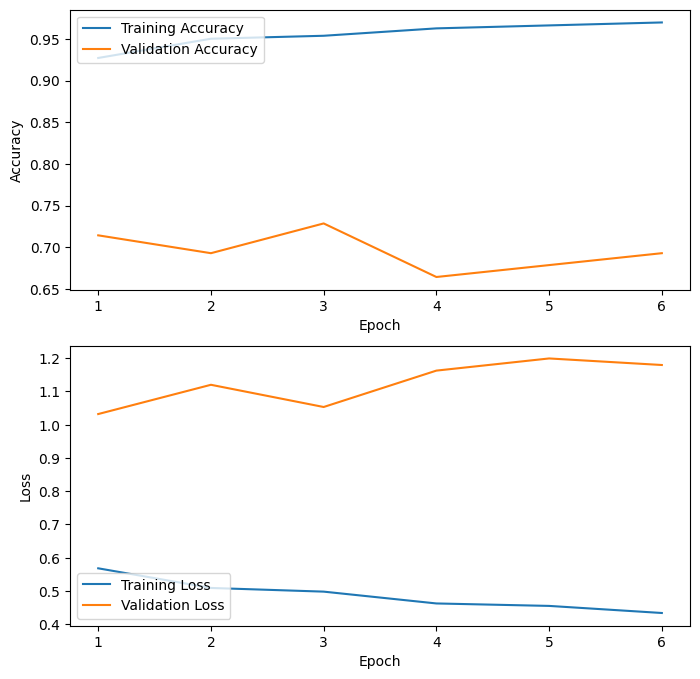

In [ ]:
#Clear Session
tf.keras.backend.clear_session()


# Compile Model
HCM_V10_hyper.compile(                                                                                                                             
    optimizer=optimizers.Adam(learning_rate=0.0002),
    loss='binary_crossentropy',
    metrics=['accuracy']
    )

# Fit Model
# Note: to increase efficiency the number of max epochs was reduced to 50
HCM_V10_hyper_fitted = HCM_V10_hyper.fit(                                                                                                                 
    ds_train,
    validation_data = ds_val,
    epochs = 50, 
    verbose=1,
    callbacks=[early_stopping, checkpoint_v10_hyper])                                                                                              

#Save and visualise the learning curves
plot_curves(model_fit = HCM_V10_hyper_fitted, model_name = model_name) 

It can be seen, that the Hypertuned Model is not able to get to the highest validation accuracy. This is probably due to the small validation set, which can lead to differences in performance between several attempts.

In [ ]:
HCM_V10_hyper.evaluate(ds_test)

11/11 [==============================] - 144s 2s/step - loss: 0.9812 - accuracy: 0.6746


[0.9812275171279907, 0.674626886844635]

Using the hypertuned model, it was possible to achieve a accuracy of ``0.6746``. In comparison to the Handcrafted(``0.6507``) model, this is an increase of ``0.0239``

## 4.3.2 Evaluating on the fitted model using the whole training data

Following the Training and the Validation Set get combined to one training set again. Next the model is fitted on the whole training data and evaluated on the test set. 

In [ ]:
ds_combined = ds_train.concatenate(ds_val)
# shuffle the combined dataset
ds_combined = ds_combined.shuffle(buffer_size=10000, seed=123)

In [ ]:
# Rebuilding the model based on the optimal hyperparameters
model_name = "HCM_V10_Tuned_Full_Train"

HCM_V10_Tuned_Full_Train = Sequential([
    # Input layer
    layers.Input(input_shape),
    # Normalization pipeline
    data_normalization,
    # 1. conv layer
    layers.Conv2D(filters=7, kernel_size=(7, 7), activation='relu', kernel_regularizer=regularizers.l2(0.02)),
    layers.MaxPooling2D(pool_size=(2, 2)),
    # 2. conv layer
    layers.Conv2D(filters=16, kernel_size=(7, 7), activation='relu', kernel_regularizer=regularizers.l2(0.08)),
    layers.MaxPooling2D(pool_size=(2, 2)),
    # Flatten layer
    layers.Flatten(),
    # Fully connected layers with Batch Normalization and Dropout
    layers.Dense(units=140, activation='relu', kernel_initializer=initializers.GlorotNormal(seed=seed)),
 
    Dropout(0.1),
    layers.Dense(units=66, activation='relu', kernel_initializer=initializers.GlorotNormal(seed=seed)),
   
    Dropout(0.1),
    layers.Dense(units=60, activation='relu', kernel_initializer=initializers.GlorotNormal(seed=seed)),
    
    Dropout(0.30000000000000004),
    # Output layer
    layers.Dense(1, activation="sigmoid")
], name=model_name)


HCM_V10_Tuned_Full_Train.summary() 


Model: "HCM_V10_Tuned_Full_Train"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_pipeline (Seq  (None, 224, 224, 3)      0         
 uential)                                                        
                                                                 
 conv2d (Conv2D)             (None, 218, 218, 7)       1036      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 109, 109, 7)      0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 103, 103, 16)      5504      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 51, 51, 16)       0         
 2D)                                                             
                                          

In [ ]:
early_stopping_full = EarlyStopping(
    monitor='accuracy',
    patience=5,
    verbose = 1,
    restore_best_weights=True)

In [ ]:
# Compile Model
HCM_V10_Tuned_Full_Train.compile(                                                                                                                             
    optimizer=optimizers.Adam(learning_rate=0.0002),
    loss='binary_crossentropy',
    metrics=['accuracy']
    )

HCM_V10_hyper_fitted_full_training_hist = HCM_V10_Tuned_Full_Train.fit(                                                                                                                 
    ds_combined,
    epochs = 100, 
    verbose=1,
    callbacks=[early_stopping_full])   

HCM_V10_Tuned_Full_Train.evaluate(ds_test)

Epoch 1/100
23/23 [==============================] - 36s 30ms/step - loss: 1.5202 - accuracy: 0.4879
Epoch 2/100
23/23 [==============================] - 11s 31ms/step - loss: 1.3749 - accuracy: 0.5775
Epoch 3/100
23/23 [==============================] - 11s 29ms/step - loss: 1.2761 - accuracy: 0.5818
Epoch 4/100
23/23 [==============================] - 12s 29ms/step - loss: 1.2010 - accuracy: 0.6003
Epoch 5/100
23/23 [==============================] - 12s 27ms/step - loss: 1.1417 - accuracy: 0.5875
Epoch 6/100
23/23 [==============================] - 12s 30ms/step - loss: 1.0617 - accuracy: 0.6743
Epoch 7/100
23/23 [==============================] - 10s 29ms/step - loss: 1.0006 - accuracy: 0.6714
Epoch 8/100
23/23 [==============================] - 12s 29ms/step - loss: 0.9439 - accuracy: 0.7112
Epoch 9/100
23/23 [==============================] - 12s 28ms/step - loss: 0.8952 - accuracy: 0.7141
Epoch 10/100
23/23 [==============================] - 12s 29ms/step - loss: 0.8580 - accura

[1.8732606172561646, 0.641791045665741]

As expected training the model on the whole training dataset leads to worse results than before. This could be due to the relatively small size of the dataset. With a model trained on the whole test set we achieve an accuracy of ``0.64`` on the test set, which is 0.028 percentage points worse than the accuracy achieved with the model fitted on the training/validation split. This is in line with the trials we have seen at the end of the handcrafted notebook.
